### Importing packages

In [1]:
from os import listdir
from torch.utils.data import Dataset
from PIL import Image
from datasets import load_dataset 
from transformers import LayoutLMv3ForTokenClassification, AdamW
from tqdm.notebook import tqdm
from torch.utils.data import DataLoader
from sklearn.utils import resample
from torch.utils.data import DataLoader
from PIL import ImageDraw, ImageFont, Image
import numpy as np
from transformers import AutoProcessor
from transformers import AutoProcessor
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix
import torch.nn as nn
import numpy as np
import mlflow
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import torch

### Importing data

In [2]:
# i import also the whole dataset, because i need to map the annotations with images

dataset = load_dataset("naver-clova-ix/cord-v2")

In [3]:
train_data = dataset["train"]
validate_data = dataset["validation"]
test_data = dataset["test"]

In [4]:
# importing annotations
train = pd.read_pickle('Dataset/train.pkl')
val = pd.read_pickle('Dataset/val.pkl')
test = pd.read_pickle('Dataset/test.pkl')

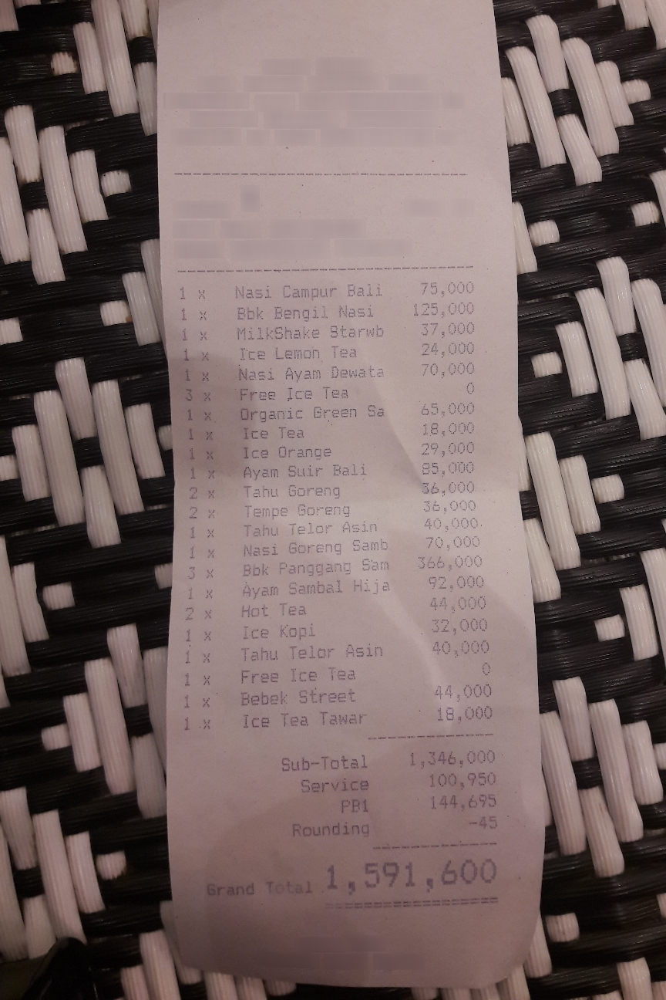

In [5]:
train_data[0]['image']

### Visualisations to see the distribution of Data

In [6]:
image_ids_train, words_train, boxes_train, labels_train = train
image_ids_val, words_val, boxes_val, labels_val = val
image_ids_test, words_test, boxes_test, labels_test = test

O                    10133
total.total_price      764
Name: count, dtype: int64


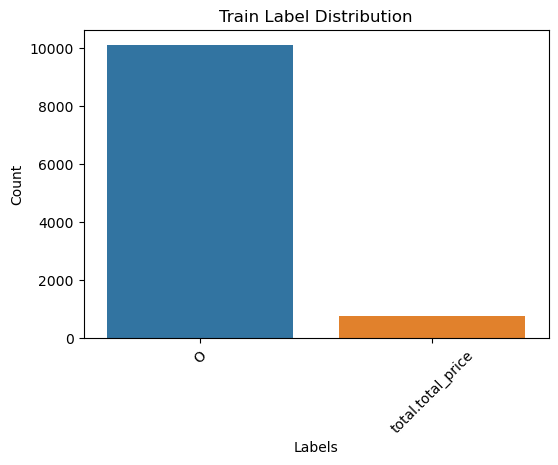

O                    1113
total.total_price      96
Name: count, dtype: int64


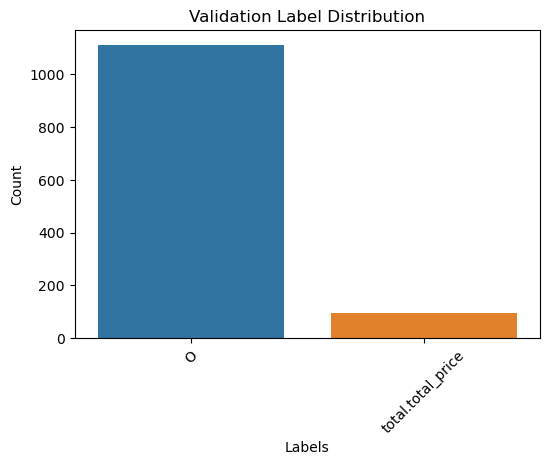

O                    1203
total.total_price      93
Name: count, dtype: int64


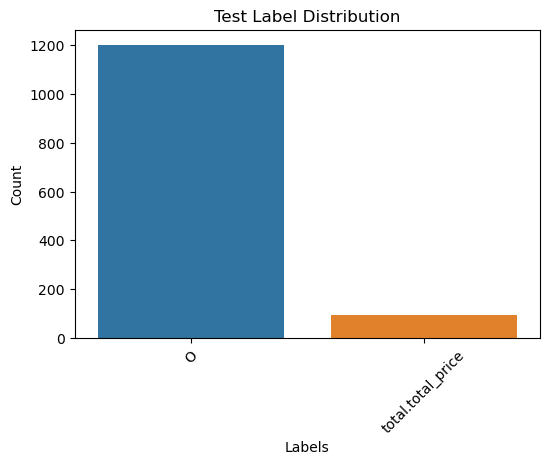

In [7]:
def plot_label_distribution(labels, title):
    label_counts = pd.Series([label for sublist in labels for label in sublist]).value_counts()
    print(label_counts)
    plt.figure(figsize=(6, 4))
    sns.barplot(x=label_counts.index, y=label_counts.values)
    plt.title(title)
    plt.xlabel('Labels')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

# Ploting the distribution for each dataset
plot_label_distribution(labels_train, 'Train Label Distribution')
plot_label_distribution(labels_val, 'Validation Label Distribution')
plot_label_distribution(labels_test, 'Test Label Distribution')

We can observe a significant imbalance in the dataset, which could pose challenges for the model's performance.

However, let's proceed with an experiment to determine its efficiency even with the imabalanced data. If we find that the model is not performing adequately, there are several solutions we can explore to address this issue (resambpling, class_weights, data augmentation)

However, we need to pay attention to the metrics. Therefore, I will focus on the following metrics (F1 score, Precision,Confusion Matrix, Recall) to ensure a thorough evaluation for the imbalanced data

let's first create `id2label` and label2id mappings, for inference

In [8]:
labels = ['O', 'total.total_price']
label2id = {label: idx for idx, label in enumerate(labels)}
id2label = {idx: label for idx, label in enumerate(labels)}

print("label2id:", label2id)
print("id2label:", id2label)


label2id: {'O': 0, 'total.total_price': 1}
id2label: {0: 'O', 1: 'total.total_price'}


### Modelisation

the following code is a classic on how to code a deep learning problem (Preparing Datasets, afterwards the dataloaders then developing the model)

So, let's prepare our CordDataset First 

In [9]:
class CORDDataset(Dataset):

    def __init__(self, annotations, dataset, processor=None, max_length=512):
        self.image_indices, self.words, self.boxes, self.labels = annotations
        self.dataset = dataset
        self.processor = processor

    def __len__(self):
        return len(self.image_indices)

    def __getitem__(self, idx):
        # Loading the image using the index
        image_idx = self.image_indices[idx]
        image = self.dataset[image_idx]['image'].convert("RGB")

        # Getting word-level annotations 
        words = self.words[idx]
        boxes = self.boxes[idx]
        word_labels = self.labels[idx]
        
        word_labels = [label2id[label] for label in word_labels]

        # processor to prepare the input to the model
        encoded_inputs = self.processor(image, words, boxes=boxes, word_labels=word_labels, 
                                        padding="max_length", truncation=True, 
                                        return_tensors="pt")
        
        # Remove batch dimension
        for k,v in encoded_inputs.items():
            encoded_inputs[k] = v.squeeze()

        # i return also the image_idx, for inference
        return image_idx, encoded_inputs

I developed my custom Trainer class to have greater control over the training and evaluation process of my model (i like to have control of it), i could have used pytorchlightning but i prefer this way

Notes : 
- I use mlflow to track the metrics of the experiments (big fan of mlflow )
- I am gonna use a pretrained LayoutLMv3 model (so am gonna be finetuning)
- After the evaluation i log the best model into mlflow based on the minimum val_loss (we can also do maximum f1 score)

In [10]:

class Trainer:
    def __init__(self, model_name, num_labels, lr, weight_decay, device):
        self.model = LayoutLMv3ForTokenClassification.from_pretrained(model_name, num_labels=num_labels)
        self.optimizer = self.configure_optimizer(lr, weight_decay)
        self.device = device
        self.train_losses = []
        self.validation_metrics = {}
        self.model.to(self.device)
        self.best_model_state = None

    def fit(self, train_dataloader, validation_dataloader, epochs):
        best_val_loss = float('inf')
        for epoch in range(epochs):
            print("")
            print(f'======== Epoch {epoch + 1} / {epochs} ========')
            print('Training...')
            train_loss = self._train(train_dataloader)
            print(f"train loss: {train_loss:.2f}")
            mlflow.log_metric("avg_train_loss", train_loss, step=epoch)
            print("")
            print("Running Validation...")
            metrics = self._validate(validation_dataloader)
            print("")
            print("Eval Metrics:")
            for metric, value in metrics.items():
                print(f"{metric}: {value:.4f}")
            
            mlflow.log_metric("avg_eval_loss", metrics['val_loss'], step=epoch)
            mlflow.log_metric("precision", metrics['precision'], step=epoch)
            mlflow.log_metric("recall", metrics['recall'], step=epoch)
            mlflow.log_metric("f1_score_weighted", metrics['f1_score_weighted'], step=epoch)
            mlflow.log_metric("f1_score_micro", metrics['f1_score_micro'], step=epoch)

            self.train_losses.append(train_loss)
            self.validation_metrics[epoch] = metrics
            
            if metrics['val_loss'] < best_val_loss:
                best_val_loss = metrics['val_loss']
                self.best_model_state = self.model.state_dict().copy()
                print("Best model saved successfully")
        
    def _train(self, train_dataloader):
        total_tr_loss = 0
        self.model.train()
        for step, (idx, batch) in enumerate(train_dataloader):
            input_ids = batch['input_ids'].to(self.device)
            bbox = batch['bbox'].to(self.device)
            pixel_values = batch['pixel_values'].to(self.device)
            attention_mask = batch['attention_mask'].to(self.device)
            labels = batch['labels'].to(self.device)
            self.optimizer.zero_grad()
            outputs = self.model(input_ids=input_ids, attention_mask=attention_mask, bbox=bbox, pixel_values=pixel_values, labels=labels)
            loss = outputs.loss
            total_tr_loss += loss.item()
            loss.backward()
            self.optimizer.step()

            if step % 200 == 0:
                print(f"Step: {step}, Loss: {loss.item():.4f} [{step} / {len(train_dataloader)}]")
                mlflow.log_metric("train_loss", loss.item(), step=step)

        avg_train_loss = total_tr_loss / len(train_dataloader)
        return avg_train_loss
        
    def _validate(self, validation_dataloader):
        total_eval_loss = 0
        all_preds = []
        all_labels = []
        self.model.eval()
        for step, (idx, batch) in enumerate(validation_dataloader):
            input_ids = batch['input_ids'].to(self.device)
            bbox = batch['bbox'].to(self.device)
            pixel_values = batch['pixel_values'].to(self.device)
            attention_mask = batch['attention_mask'].to(self.device)
            labels = batch['labels'].to(self.device)
            with torch.no_grad():
                outputs = self.model(input_ids=input_ids, attention_mask=attention_mask, bbox=bbox, pixel_values=pixel_values, labels=labels)
                loss = outputs.loss
                total_eval_loss += loss.item()
                preds = torch.max(outputs.logits, -1).indices

                # Filter out labels and predictions to exclude -100
                mask = labels != -100
                filtered_preds = preds[mask]
                filtered_labels = labels[mask]

                all_preds.append(filtered_preds.cpu().numpy())
                all_labels.append(filtered_labels.cpu().numpy())

                
        all_preds = np.concatenate(all_preds)
        all_labels = np.concatenate(all_labels)

        average_eval_loss = total_eval_loss / len(validation_dataloader)
        precision = precision_score(all_labels, all_preds, average='weighted')
        recall = recall_score(all_labels, all_preds, average='weighted')
        f1_weighted = f1_score(all_labels, all_preds, average='weighted')
        f1_micro = f1_score(all_labels, all_preds, average='micro')

        dict_metrics = {
            'val_loss': average_eval_loss,
            'precision': precision,
            'recall': recall,
            'f1_score_weighted': f1_weighted,
            'f1_score_micro': f1_micro
        }

        return dict_metrics
    
    def configure_optimizer(self, lr, weight_decay):
        return torch.optim.AdamW(
            self.model.parameters(), lr=lr, weight_decay=weight_decay
        )
        
    def load_best_model(self):
        if self.best_model_state is not None:
            self.model.load_state_dict(self.best_model_state)
            print("Loaded the best model.")
        else:
            print("No model to load")

I used this hyperparameters for fine tuning the model, I didn't tune them but the important thing is to pay attention to lr, lowering the learning rate can help mitigate catastrophic forgetting during fine-tuning. so i used a lr = 2e-5, weight_decay = 1e-8 and batch_size = 4

In [11]:
lr = 2e-5
weight_decay = 1e-8
num_labels = 2
epochs = 3
batch_size = 4
model_name = 'microsoft/layoutlmv3-base'
device = torch.device('cuda')


trainer = Trainer(model_name, num_labels, lr, weight_decay, device)

Some weights of LayoutLMv3ForTokenClassification were not initialized from the model checkpoint at microsoft/layoutlmv3-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [12]:
processor = AutoProcessor.from_pretrained(model_name, apply_ocr=False)

In [13]:
train_dataset = CORDDataset(annotations=train,
                            dataset=train_data,
                            processor=processor)
val_dataset = CORDDataset(annotations=val,
                            dataset=validate_data,
                            processor=processor)
test_dataset = CORDDataset(annotations=test,
                            dataset=test_data,
                            processor=processor)

In [14]:
train_dataloader = DataLoader(train_dataset, batch_size, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size)

In [15]:
# this is my experiment
experiment_name = "Test_technique_experiments"
mlflow.set_experiment(experiment_name)

<Experiment: artifact_location='file:///c:/Users/ahmed/Desktop/Test-technique/mlruns/521796739614111031', creation_time=1720784402780, experiment_id='521796739614111031', last_update_time=1720784402780, lifecycle_stage='active', name='Test_technique_experiments', tags={}>

In [16]:
# mlflow code to track the metrics while the training/evaluation process
with mlflow.start_run() as run: 
    params = {
        "lr" : lr,
        "weight_decay" : weight_decay, 
        "epochs" : epochs,
        "batch_size" : batch_size
    }


    mlflow.log_params(params)
    trainer.fit(train_dataloader, val_dataloader, epochs)

    trainer.load_best_model()
    mlflow.pytorch.log_model(trainer.model, "model")


======== Epoch 1 / 3 ========
Training...


c:\Users\ahmed\anaconda3\envs\myenv\lib\site-packages\transformers\modeling_utils.py:1051: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(


Step: 0, Loss: 0.8751 [0 / 200]
train loss: 0.07

Running Validation...

Eval Metrics:
val_loss: 0.0136
precision: 0.9953
recall: 0.9950
f1_score_weighted: 0.9951
f1_score_micro: 0.9950
Best model saved successfully

======== Epoch 2 / 3 ========
Training...


c:\Users\ahmed\anaconda3\envs\myenv\lib\site-packages\transformers\modeling_utils.py:1051: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(


Step: 0, Loss: 0.0059 [0 / 200]
train loss: 0.02

Running Validation...

Eval Metrics:
val_loss: 0.0035
precision: 0.9992
recall: 0.9992
f1_score_weighted: 0.9992
f1_score_micro: 0.9992
Best model saved successfully

======== Epoch 3 / 3 ========
Training...


c:\Users\ahmed\anaconda3\envs\myenv\lib\site-packages\transformers\modeling_utils.py:1051: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(


Step: 0, Loss: 0.0172 [0 / 200]
train loss: 0.01

Running Validation...

Eval Metrics:
val_loss: 0.0042
precision: 0.9984
recall: 0.9983
f1_score_weighted: 0.9984
f1_score_micro: 0.9983
Loaded the best model.


c:\Users\ahmed\anaconda3\envs\myenv\lib\site-packages\_distutils_hack\__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


### Making predictions on test set and see results

In [22]:
run_id = '4a52ae2ca810454f96eba1068ed915d9'
run_dir = f'mlruns/521796739614111031/{run_id}/artifacts/model'

# Load the model from mlflow
model = mlflow.pytorch.load_model(run_dir)

In [23]:
# Results on the test data

model.eval()
all_preds = []
all_labels = []
with torch.no_grad():
    for (idx, batch) in test_dataloader:
        batch = {k: v.to(device) for k, v in batch.items() if isinstance(v, torch.Tensor)}
        outputs = model(**batch)
        preds = outputs.logits.argmax(-1).cpu().numpy()
        labels = batch['labels'].cpu().numpy()

        # Flatten predictions and labels and filter out -100 labels
        for pred, label in zip(preds, labels):
            mask = label != -100
            all_preds.extend(pred[mask])
            all_labels.extend(label[mask])

    precision = precision_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')
    f1_weighted = f1_score(all_labels, all_preds, average='weighted')
    f1_micro = f1_score(all_labels, all_preds, average='micro')

    metrics = {
        'precision': precision,
        'recall': recall,
        'f1_score_weighted': f1_weighted,
        'f1_score_micro': f1_micro
    }
metrics

{'precision': 0.9947154706790122,
 'recall': 0.9945987654320988,
 'f1_score_weighted': 0.9946382608159553,
 'f1_score_micro': 0.9945987654320988}

In [24]:
# confusion matrix
def plot_confusion_matrix(labels, preds, label_names):
    confusion = confusion_matrix(labels, preds, labels=list(range(len(label_names))))
    plt.figure(figsize=(10, 8))
    ax = sns.heatmap(
        confusion,
        annot=True,
        fmt="d",
        xticklabels=label_names,
        yticklabels=label_names,
        cmap="YlGnBu",
        cbar=False,
        annot_kws={"size": 16, "color": "black"}  
    )
    plt.title('Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

    for i in range(confusion.shape[0]):
        for j in range(confusion.shape[1]):
            text = ax.text(j + 0.5, i + 0.5, confusion[i, j],
                           ha="center", va="center", color="black", fontsize=16)

    plt.savefig('confusion_matrix.png')
    plt.show()
   


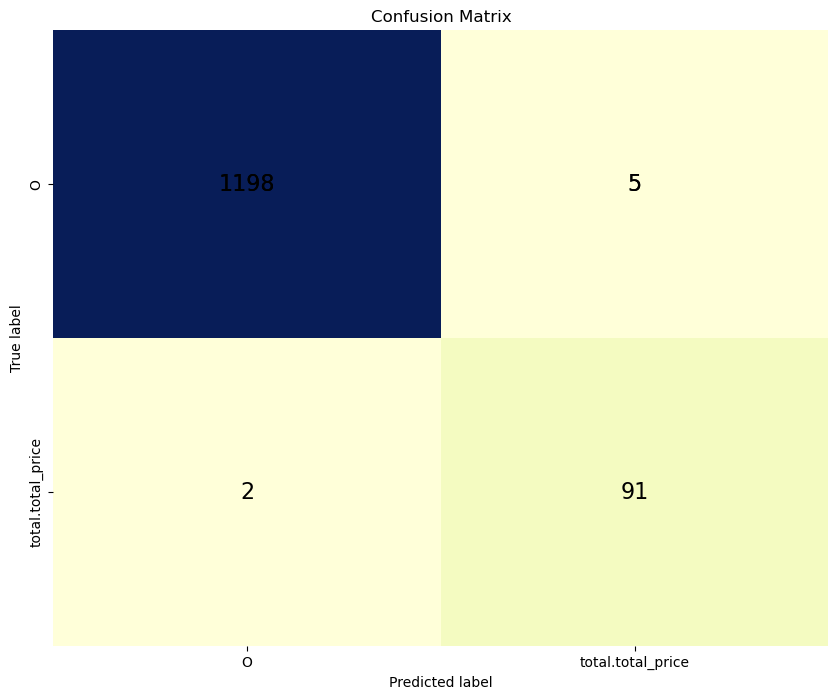

In [25]:
plot_confusion_matrix(all_labels, all_preds, ['O', 'total.total_price'])

Surprised with the results, attention mecansim works after all  🤗🤗 

The confusion matrix shows a strong performance of the model across both classes, especially considering the class imbalance in the dataset
But after all, in the industry we want perfection , and the specific metrics we  prioritize can depend heavily on the application and the consequences of different types of errors (prioritizing recall or precision)

We can also see our problem by considering the hardware phase and adapting our solutions to leverage the specified hardware efficiently (Distilation, ....)

i won't do other experiments, i am gonna content with this results

let's visualize the results on the test images

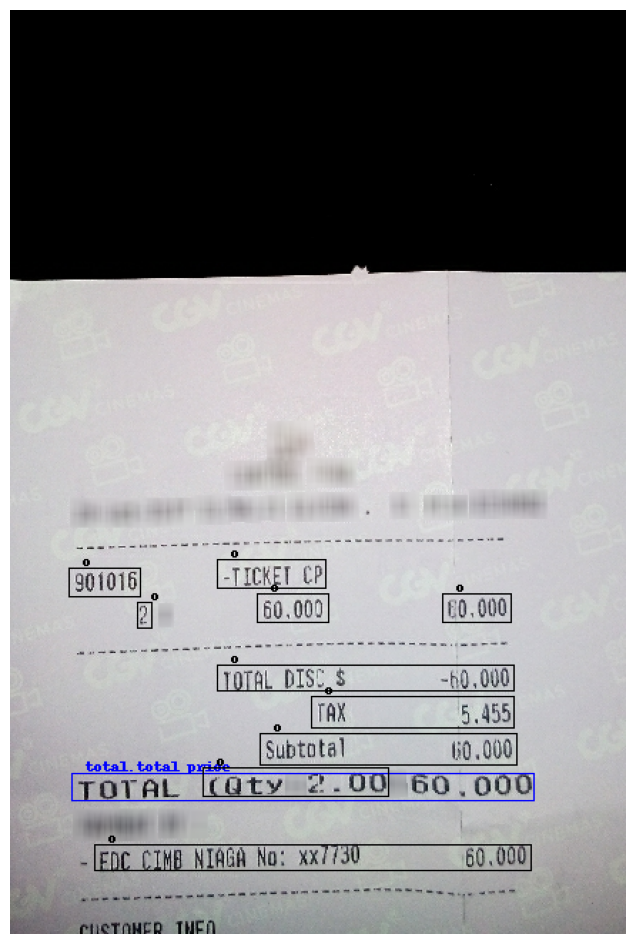

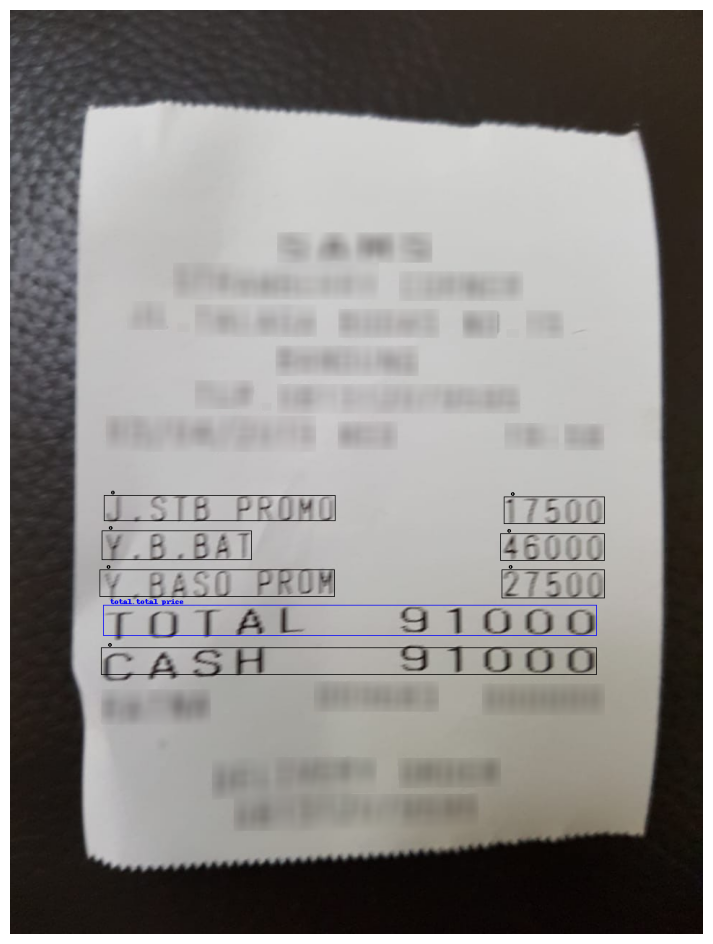

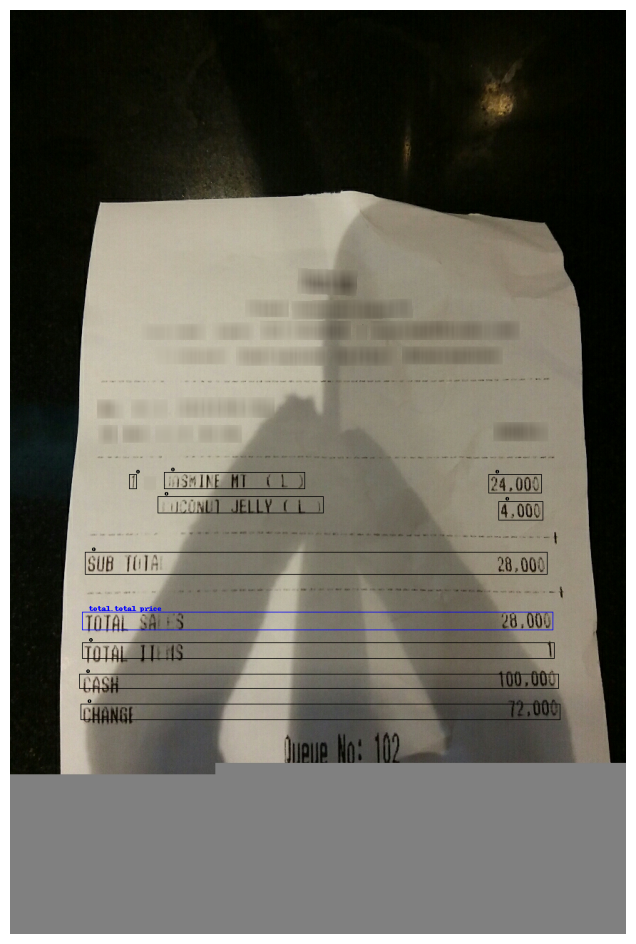

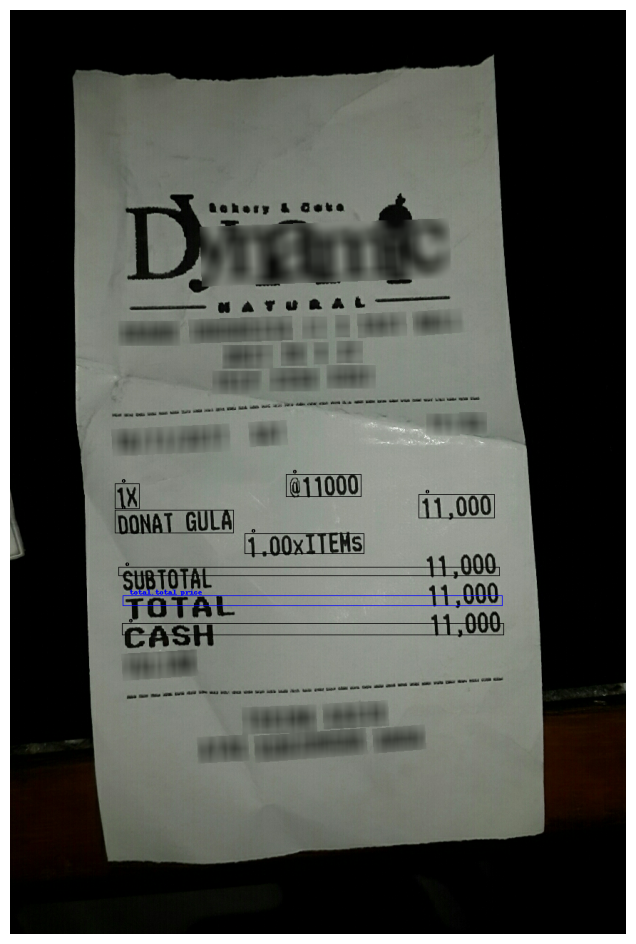

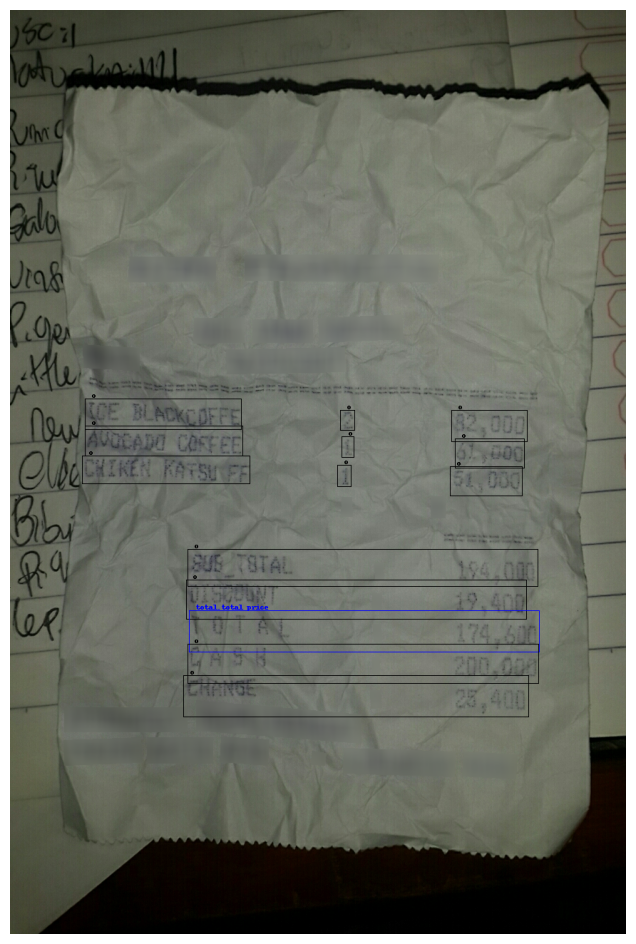

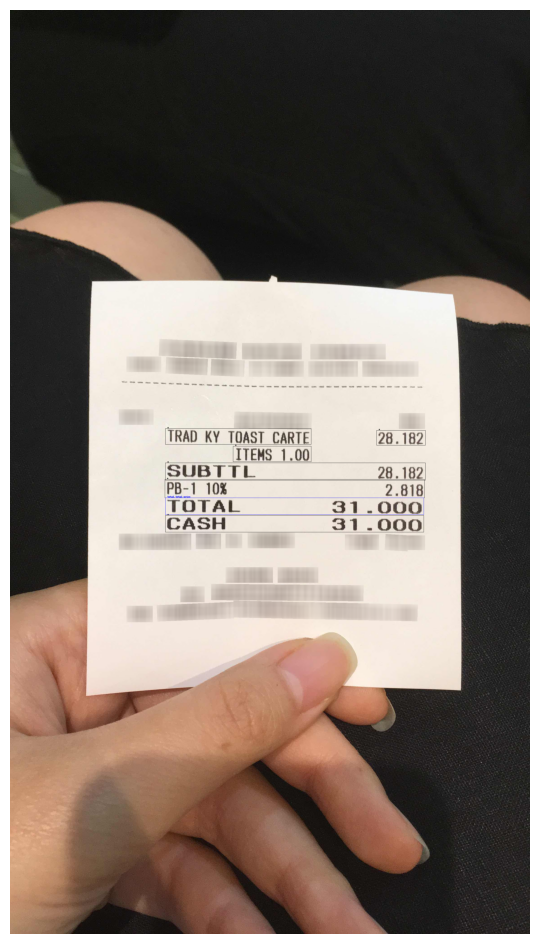

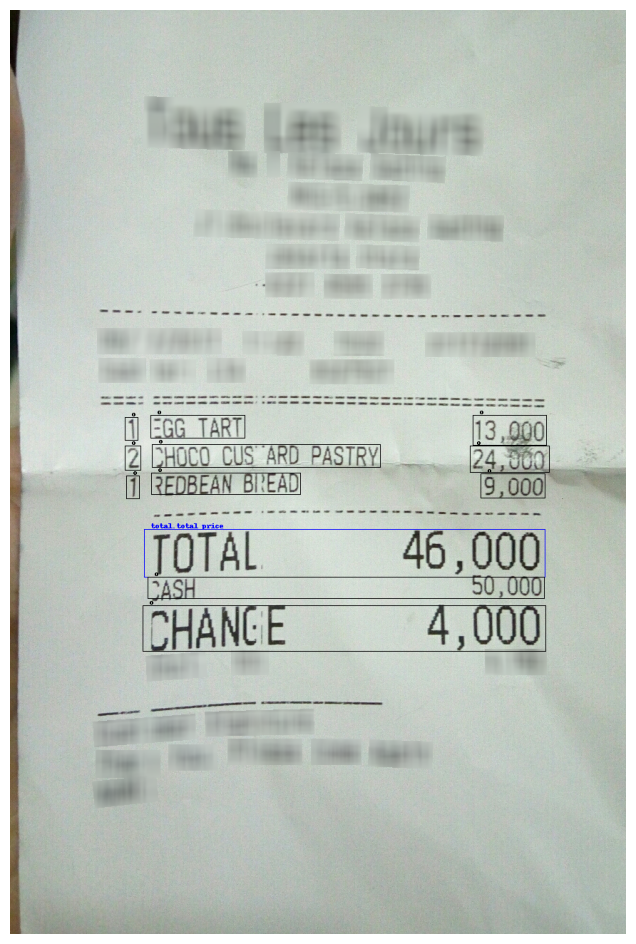

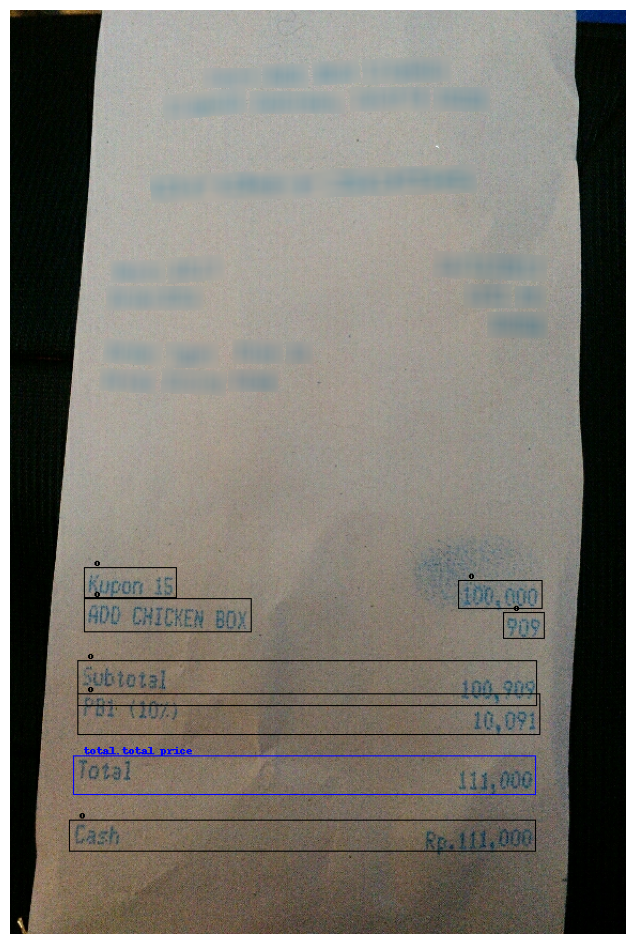

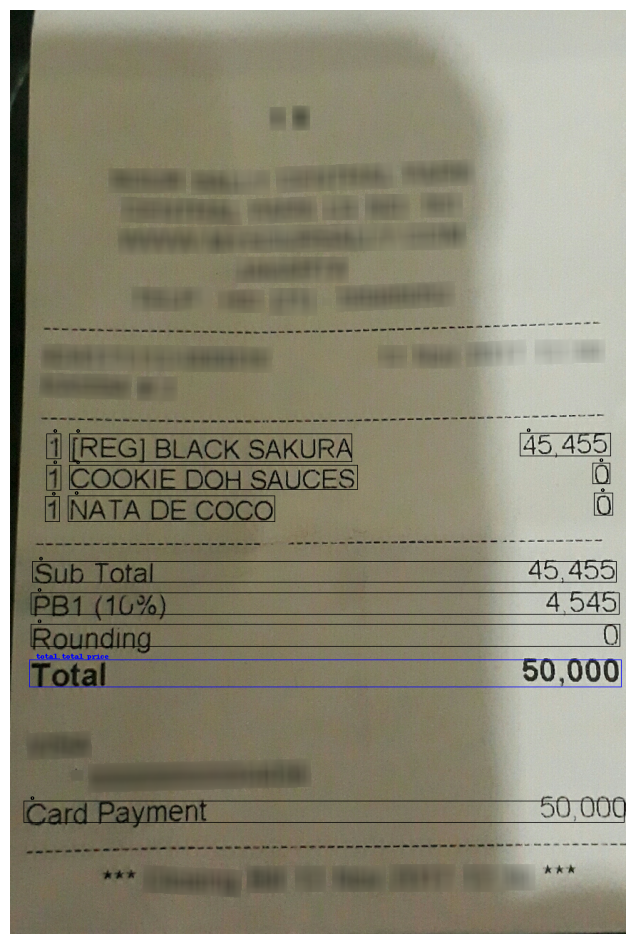

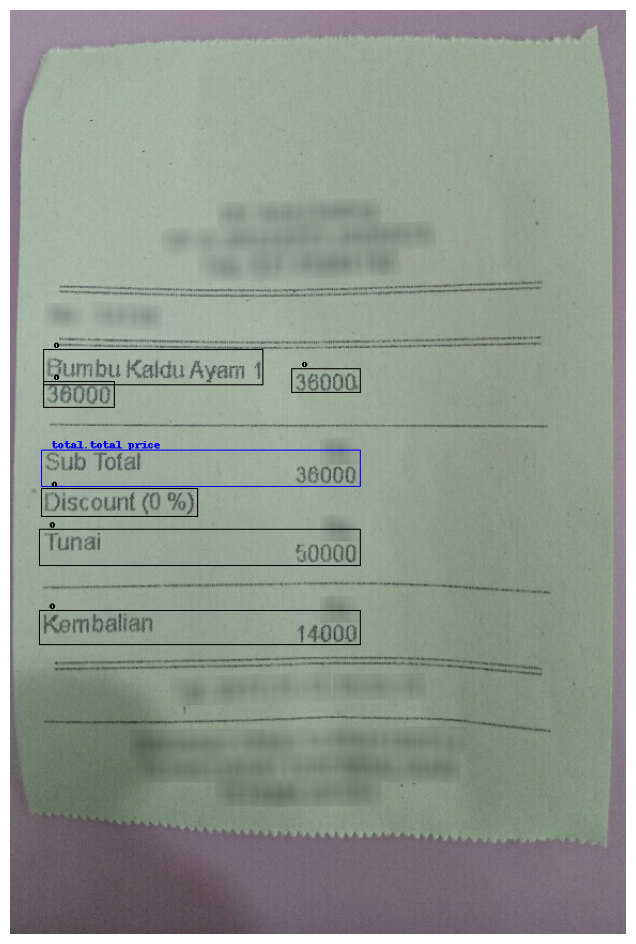

In [30]:
image_counter = 0

# we need to unormalize the box to get back to the original image dimensions
def unnormalize_box(bbox, width, height):
    return [
        int(width * (bbox[0] / 1000)),
        int(height * (bbox[1] / 1000)),
        int(width * (bbox[2] / 1000)),
        int(height * (bbox[3] / 1000)),
    ]

for batch_indices, test_batch in test_dataloader:

    for sample_idx in range(len(batch_indices)):
        
        if (image_counter == 10):
            break
        
        # Extract the image and annotations
        image_idx = batch_indices[sample_idx].item()  
        image = test_dataset.dataset[image_idx]['image'].convert("RGB")  

        input_ids = test_batch['input_ids'][sample_idx].unsqueeze(0).to(device)
        bbox = test_batch['bbox'][sample_idx].unsqueeze(0).to(device)
        pixel_values = test_batch['pixel_values'][sample_idx].unsqueeze(0).to(device)
        attention_mask = test_batch['attention_mask'][sample_idx].unsqueeze(0).to(device)
        labels = test_batch['labels'][sample_idx].unsqueeze(0).to(device)

        # Make the prediction
        with torch.no_grad():
            outputs = model(input_ids=input_ids, attention_mask=attention_mask, bbox=bbox, pixel_values=pixel_values)
            predictions = outputs.logits.argmax(-1).squeeze().tolist()

        token_boxes = bbox.squeeze().tolist()
        width, height = image.size

        true_predictions = [id2label[prediction] for prediction, label in zip(predictions, labels.squeeze().tolist()) if label != -100]
        true_boxes = [unnormalize_box(box, width, height) for box, label in zip(token_boxes, labels.squeeze().tolist()) if label != -100]

        # Draw the boxes and labels on the image
        draw = ImageDraw.Draw(image)
        font = ImageFont.load_default()

        label2color = {'total.total_price': 'blue', 'o': 'black'}  

        for prediction, box in zip(true_predictions, true_boxes):
            predicted_label = prediction.lower()
            draw.rectangle(box, outline=label2color.get(predicted_label, 'black'))
            draw.text((box[0] + 10, box[1] - 10), text=predicted_label, font=font, fill=label2color.get(predicted_label, 'black'))

        # Displaying the image with the predicted boxes
        plt.figure(figsize=(12, 12))
        plt.imshow(image)
        plt.axis('off')
        plt.show()
        
        image_counter += 1

while working on the problem i got some ideas (just ideas that might be useful in certain cases 🤗 ), i list them here :
- Investigate the data  where the model made incorrect predictions to understand the reasons behind these errors. It might be that the data was poorly formatted.
- Cluster the images into two groups: one with well-formatted data and another with poorly formatted data.
- Modify the poorly formatted data to more closely match the well-formatted data, which could help the model make better predictions on these instances. (some processing)
- Classifier to determine the group. Based on the classification, route to the appropriate specialized model 

(Inspiration from Mixture of experts ensembles paper)